<a href="https://colab.research.google.com/github/jitendra423/capstone_projects/blob/main/Mobile_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font size='8px'><font color='#FF3206'>**Project Name**    - <font color='#3792cb'>Mobile Price Range Prediction

##### <font size='5px'>**Project Type**    - **Classification/ Supervised Machine Learning**
##### **Contribution**    - Individual
##### **Name**    - Jitendra Kumar

# **Git Hub -**


# Project Summary

In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory, etc) and its selling price. In this problem, we do not have to predict the actual price but a price range indicating how high the price is

# Data Fields

* Battery_power - Total energy a battery can store in one time measured in mAh
* Blue - Has bluetooth or not
* Clock_speed - speed at which microprocessor executes   instructions
* Dual_sim - Has dual sim support or not
* Fc - Front Camera mega pixels
* Four_g - Has 4G or not
*  Int_memory - Internal Memory in Gigabytes
* M_dep - Mobile Depth in cm
* Mobile_wt - Weight of mobile phone
* N_cores - Number of cores of processor
* Pc - Primary Camera mega pixels
* Px_height - Pixel Resolution Height
* Px_width - Pixel Resolution Width
* Ram - Random Access Memory in Mega
* Touch_screen - Has touch screen or not
* Wifi - Has wifi or not
* Sc_h - Screen Height of mobile in cm
* Sc_w - Screen Width of mobile in cm 
* Talk_time - longest time that a single battery charge will last when you are
* Three_g - Has 3G or not
* Wifi - Has wifi or not
* Price_range - This is the target variable with value of 0(low cost), 1(medium cost),  




# ***Let's Begin !***

## Import Libraries

In [ ]:
# importing  all necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import StackingClassifier
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report

import warnings
warnings.filterwarnings("ignore")

## Import Data

In [ ]:
# import drive 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# read data from drive
data=pd.read_csv('/content/drive/MyDrive/Jitu/data_mobile_price_range.csv')

In [ ]:
# Set up for view all featues
pd.set_option('display.max_columns',None)

## First View Of The Data

In [ ]:
# select first 5 rows
data.head(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


## Last View Of The Data

In [ ]:
# select last five rows
data.tail(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,16,483,754,3919,19,4,2,1,1,1,3


## Shape Of The Data

## Columns

In [ ]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
# 2000 records
# 21 columns
data.shape

(2000, 21)

## Data Information

In [ ]:
# Data Information.
# all features are numeric so dtypes are int,float.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

## Data Description

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


* some fetures have outliers.


In [ ]:
data.head(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1


## Null Values

In [ ]:
# findout null values.
# There is no any null value.
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

## Duplicate Data

In [ ]:
# find out any duplicated data available in all features.
# There is not any duplicate record in entire data.
data.duplicated().sum()

0

## minimum value of px_height and sc_w cannot be zero so we need to handle that

In [ ]:
# Total phones with sc_w = 0
print(len(data[data.sc_w == 0]))
# Total phones with px_height = 0
print(len(data[data.px_height == 0]))

180
2


In [ ]:
#where ther is sc_W and px_height is zero ,assigning mean values
data['sc_w'][data[data.sc_w == 0].index] = data.sc_w.mean()
data['px_height'][data[data.px_height == 0].index] = data.px_height.mean()

## Nunique data

In [ ]:
data.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [ ]:
data.head(3)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20.0,756,2549,9,7.0,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905.0,1988,2631,17,3.0,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263.0,1716,2603,11,2.0,9,1,1,0,2


## Value Counts

In [ ]:
# select some categorical range featues for value counts from the dataset.
for i in ['blue','clock_speed','clock_speed','fc','four_g','int_memory','n_cores','pc','sc_h','sc_w','talk_time','three_g','touch_screen','wifi','price_range']:
  print('Feature:',i)
  print(data[i].value_counts())
  print('*'*30)

Feature: blue
0    1010
1     990
Name: blue, dtype: int64
******************************
Feature: clock_speed
0.5    413
2.8     85
2.3     78
2.1     76
1.6     76
2.5     74
0.6     74
1.4     70
1.3     68
1.5     67
2.0     67
1.9     65
0.7     64
2.9     62
1.8     62
1.0     61
1.7     60
2.2     59
0.9     58
2.4     58
0.8     58
1.2     56
2.6     55
2.7     55
1.1     51
3.0     28
Name: clock_speed, dtype: int64
******************************
Feature: clock_speed
0.5    413
2.8     85
2.3     78
2.1     76
1.6     76
2.5     74
0.6     74
1.4     70
1.3     68
1.5     67
2.0     67
1.9     65
0.7     64
2.9     62
1.8     62
1.0     61
1.7     60
2.2     59
0.9     58
2.4     58
0.8     58
1.2     56
2.6     55
2.7     55
1.1     51
3.0     28
Name: clock_speed, dtype: int64
******************************
Feature: fc
0     474
1     245
2     189
3     170
5     139
4     133
6     112
7     100
9      78
8      77
10     62
11     51
12     45
13     40
16     24
15     2

## Conclusion




* Some features have record in diffrent diffrent categories but dtype is numerical instead of dtype object.
* No null value in dataset.
* No duplicacy in dataset.
* Some features have bies.
* Some features have miner outliers.
* Data set Balance, Target variable return equal data in diffrent diffrent categories.



# Explorarity Data Analysis

## Univariate Analysis.


---
Univariate analysis. The prefix 'Uni' means one, meaning 'univariate analysis' is the analysis of one variable at a time. For numeric features, we want to know the range of values present and how often these values (or groups of values) occur.


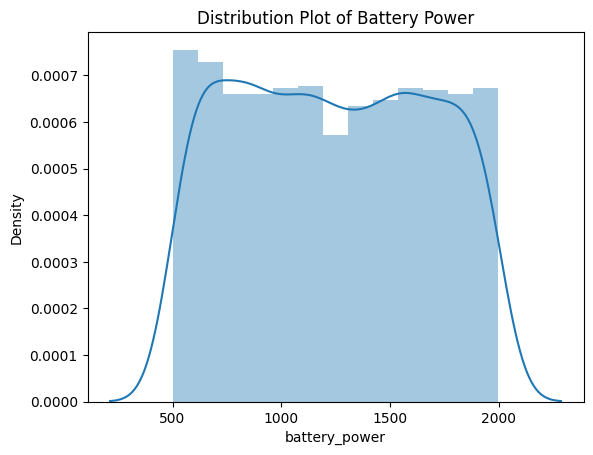

In [ ]:
# Distribution Plot on Single variable.
sns.distplot(data['battery_power'])
plt.title('Distribution Plot of Battery Power')
plt.show()

In [ ]:
data.head(3)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20.0,756,2549,9,7.0,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905.0,1988,2631,17,3.0,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263.0,1716,2603,11,2.0,9,1,1,0,2


## Chart 1. Distribution Plot

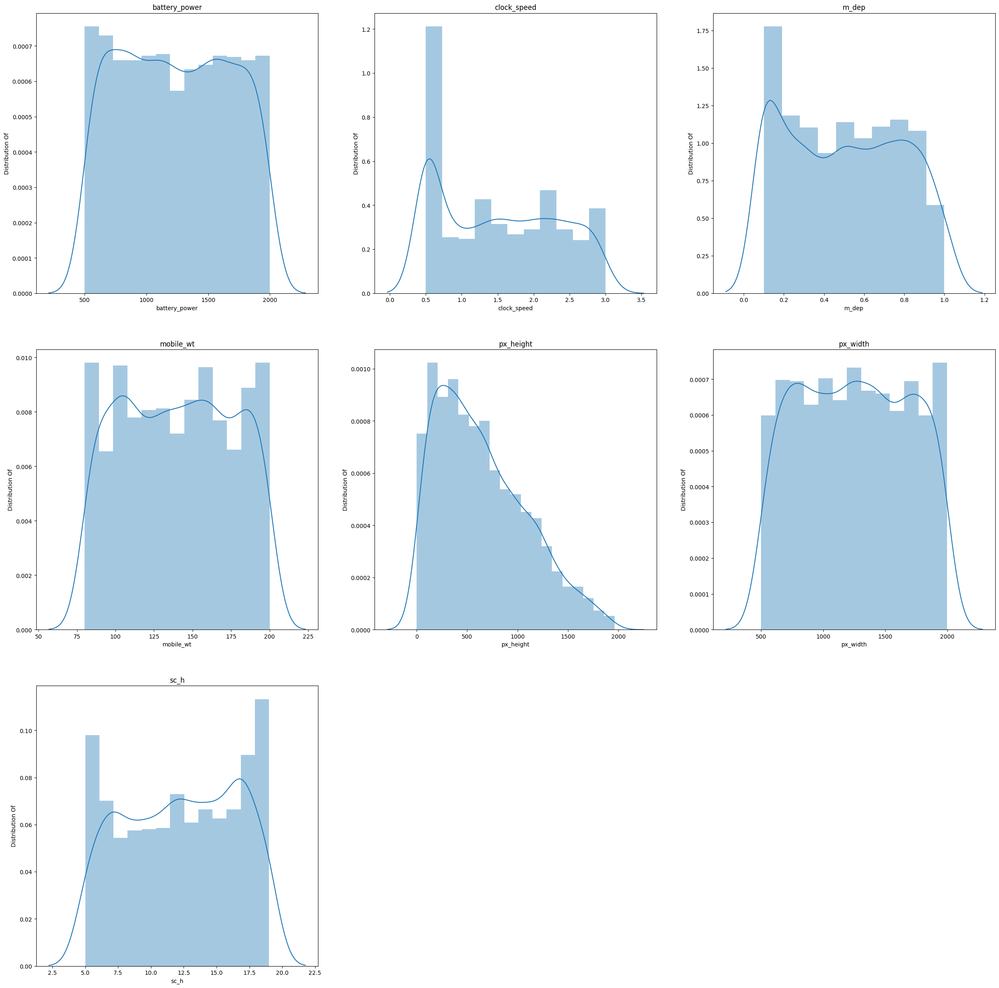

In [ ]:
# Distribution Plot Of Numerical Range Feature.
plt.figure(figsize=(30,30))
for i,j in enumerate(['battery_power','clock_speed','m_dep','mobile_wt','px_height','px_width','sc_h']):
  plt.subplot(3,3,i+1)
  sns.distplot(data[j])
  plt.title(j)
  plt.ylabel('Distribution Of')
plt.show()

### Log Distribution


---

log() method returns the natural logarithm of a number, or the logarithm of number to base.

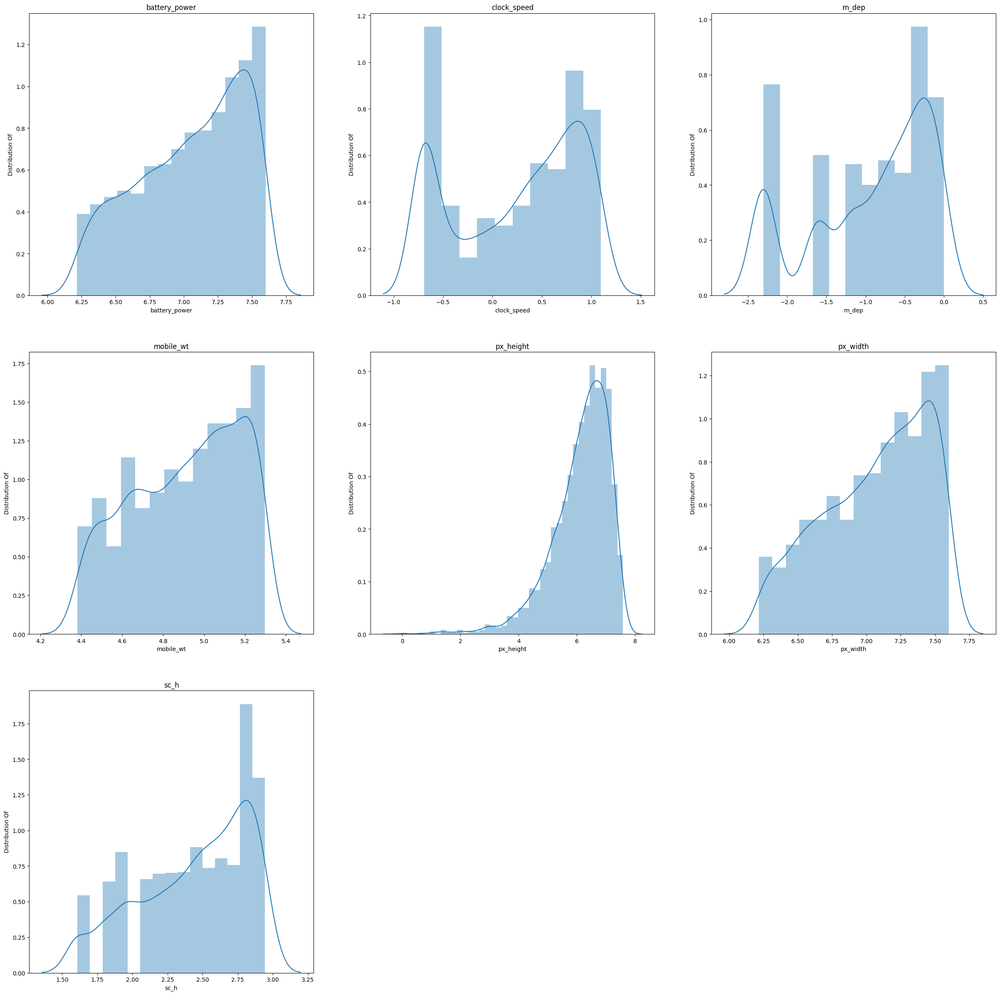

In [ ]:
# Log Distribution
plt.figure(figsize=(30,30))
for i,j in enumerate(['battery_power','clock_speed','m_dep','mobile_wt','px_height','px_width','sc_h']):
  plt.subplot(3,3,i+1)
  sns.distplot(np.log(data[j]))
  plt.title(j)
  plt.ylabel('Distribution Of')
plt.show()

### Conclusion


---

You can see above diffrent diffrent graphs some features are not following normal distribution.some features are not.when we apply log on the features then see most of features are following norma distribution.


## Chart 2.Value_Counts_Plot


---

Bar Plot

A bar chart or bar graph is a chart or graph that presents categorical data with rectangular bars with heights or lengths proportional to the values that they represent. The bars can be plotted vertically or horizontally.

A bar graph shows comparisons among discrete categories. One axis of the chart shows the specific categories being compared, and the other axis represents a measured value.

In [ ]:
# select categorical range feature.
continuous_f=['battery_power','clock_speed','m_dep','mobile_wt','px_height','px_width','sc_h']
categorical_range_f=[i for i in data.columns if i not in continuous_f]
print(len(categorical_range_f))
print(categorical_range_f)

14
['blue', 'dual_sim', 'fc', 'four_g', 'int_memory', 'n_cores', 'pc', 'ram', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi', 'price_range']


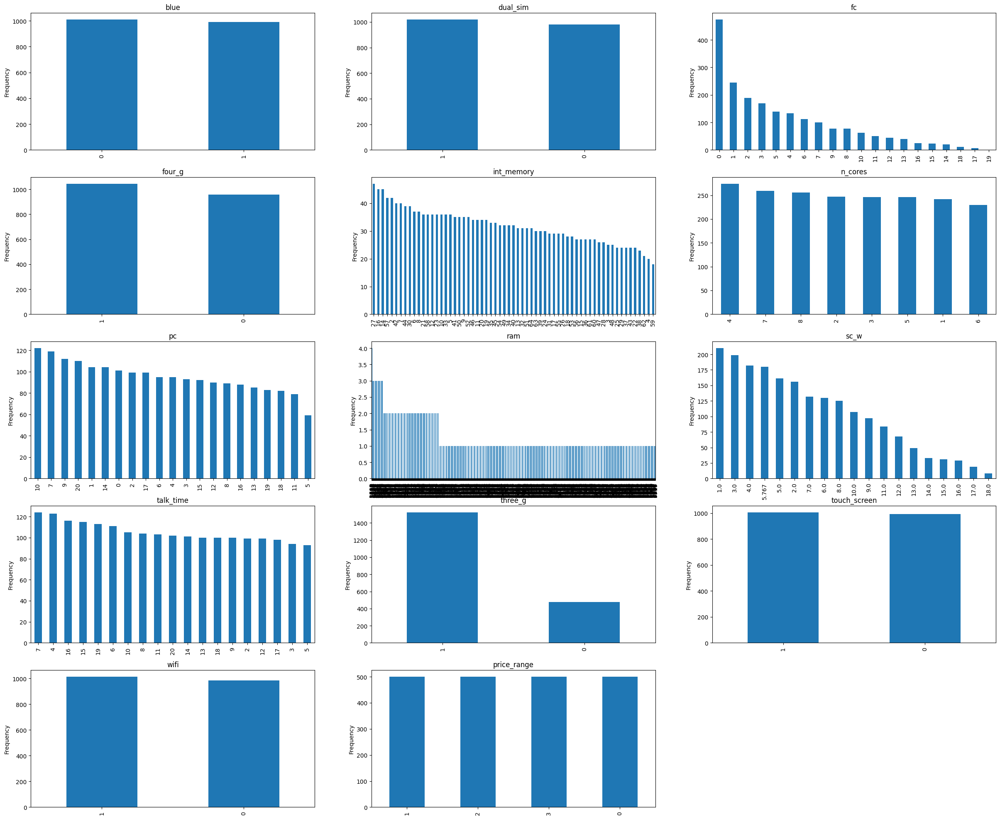

In [ ]:
# Counting Plot Using Bar Plot
plt.figure(figsize=(30,30))
for i,j in enumerate(categorical_range_f):
  plt.subplot(6,3,i+1)
  data[j].value_counts().plot(kind='bar')
  plt.title(j)
  plt.ylabel('Frequency')
plt.show()

## Chart 3.Box Plot


---

A Box-plot is used when you want to visualize the relationship between a continuous and categorical variable. This scenario occurs in classification as well as regression as listed below.

Regression: The target variable is continuous, the predictor is categorical
Classification: The target variable is categorical, the predictor is continuous
In both the scenarios, what you are trying to understand is whether the given two variables are related to each other or not? This can be done using a box plot.

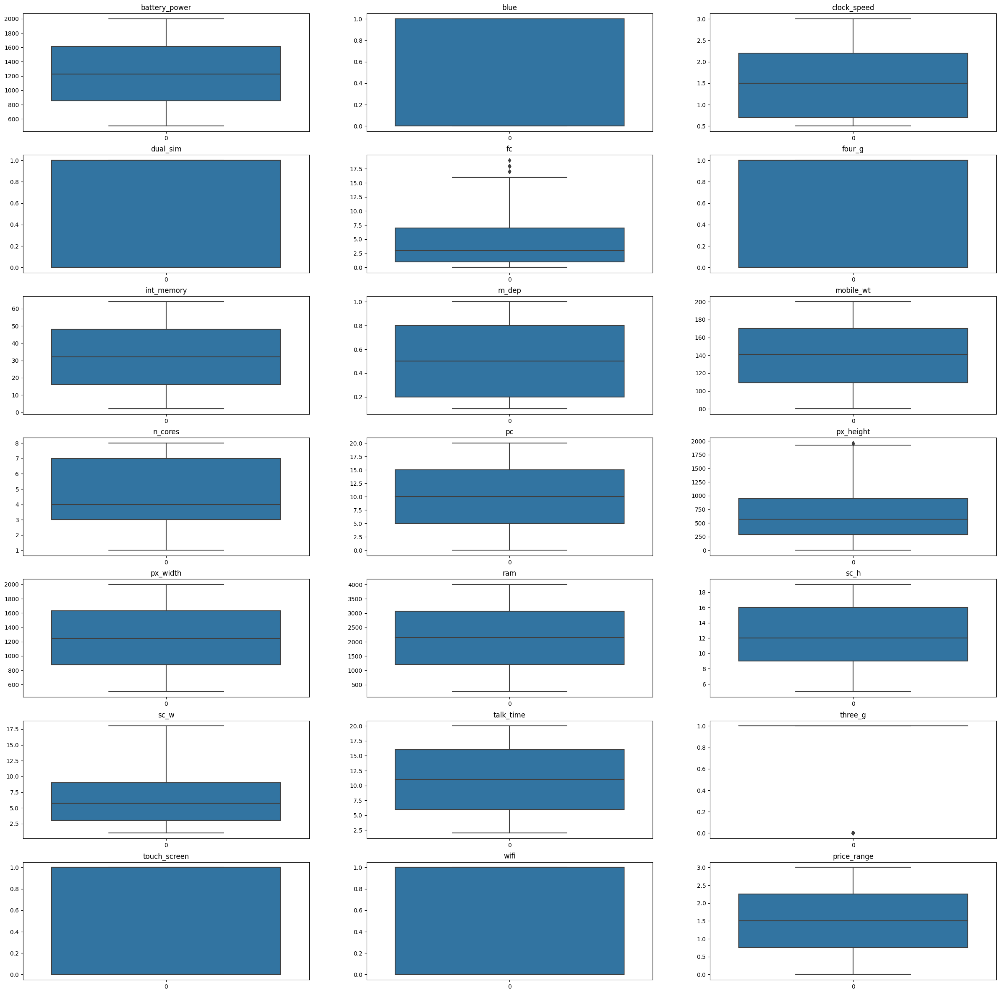

In [ ]:
# Box Plot
plt.figure(figsize=(30,30))
for i,j in enumerate(data.columns):
  plt.subplot(7,3,i+1)
  sns.boxplot(data[j])
  plt.title(j)
plt.show()

### Conclusion

---
Ther are not many outliers in data but some outliers present in m_dep features.


# Bivariate Analysis & Feature Engineering Using Graphs.


---

It is a methodical statistical technique applied to a pair of variables (features/ attributes) of data to determine the empirical relationship between them. In order words, it is meant to determine any concurrent relations (usually over and above a simple correlation analysis).

## Chart 4. Bar Plot

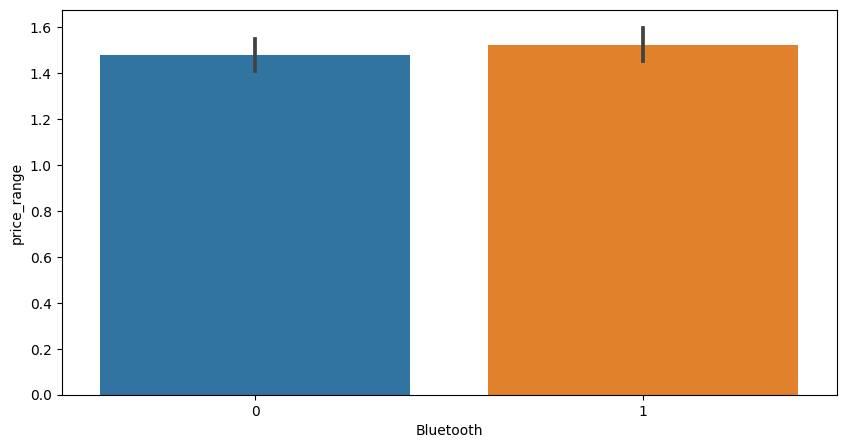

In [ ]:
#anlysis of data by vizualisation
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=data,x='blue',y='price_range',ax=ax)
plt.xlabel('Bluetooth')
plt.show()

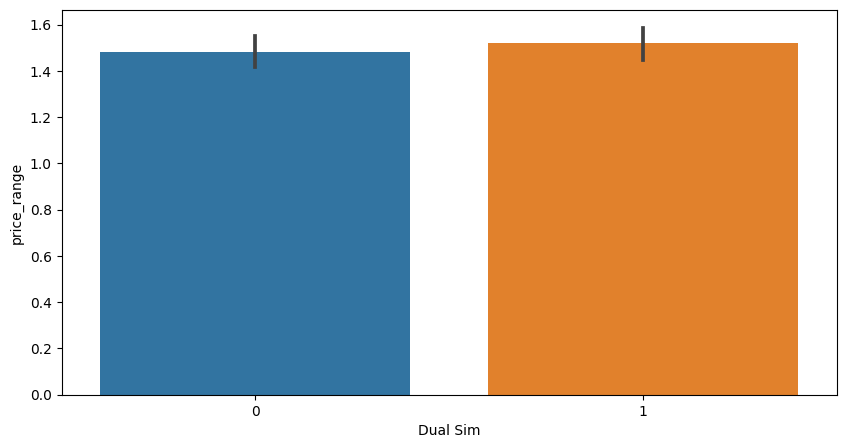

In [ ]:
#anlysis of data by vizualisation
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=data,x='dual_sim',y='price_range',ax=ax)
plt.xlabel('Dual Sim')
plt.show()

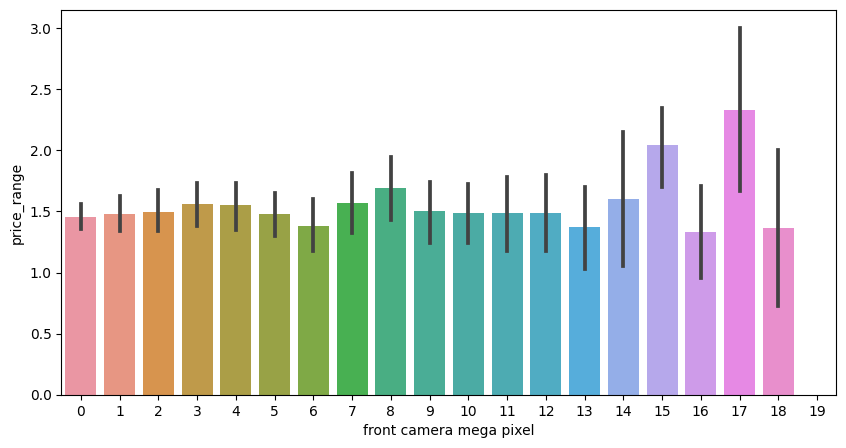

In [ ]:
#anlysis of data by vizualisation
fig,ax=plt.subplots(figsize=(10,5))
sns.barplot(data=data,x='fc',y='price_range',ax=ax)
plt.xlabel('front camera mega pixel')
plt.show()

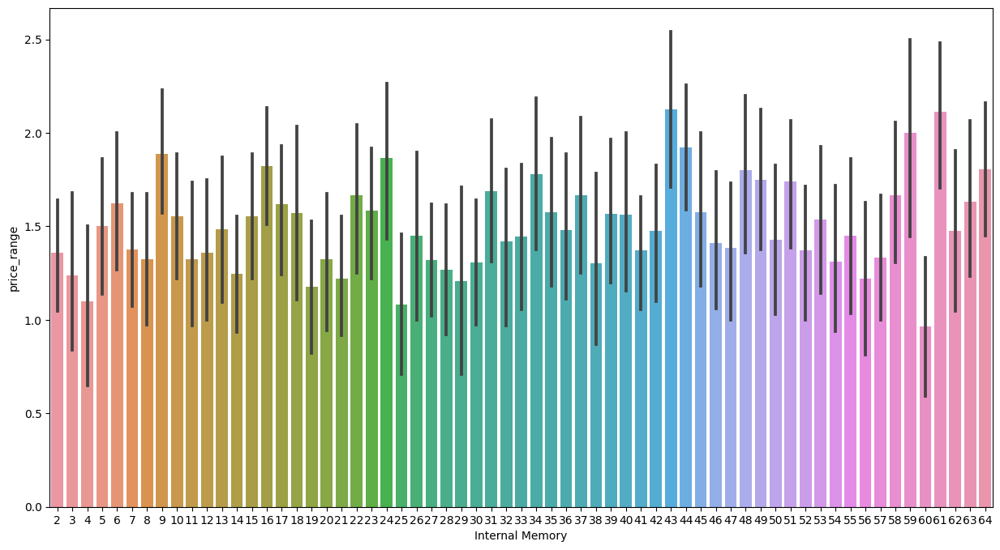

In [ ]:
#anlysis of data by vizualisation
fig,ax=plt.subplots(figsize=(15,8))
sns.barplot(data=data,x='int_memory',y='price_range',ax=ax)
plt.xlabel('Internal Memory')
plt.show()

## Chart 5. Scatter Plot

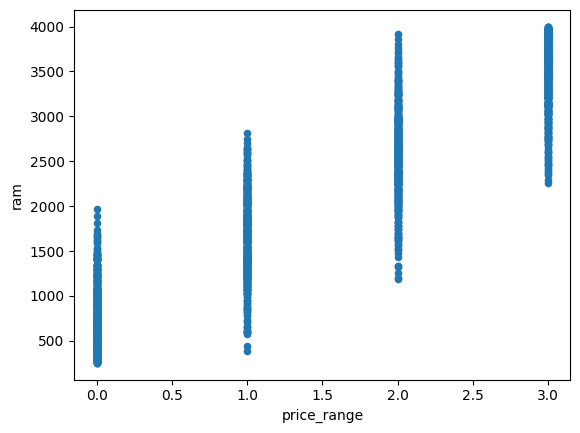

In [ ]:
# ram.
# Ram has continuous increase with price range while moving from Low cost to Very high cost.
data.plot(x='price_range',y='ram',kind='scatter')
plt.show()

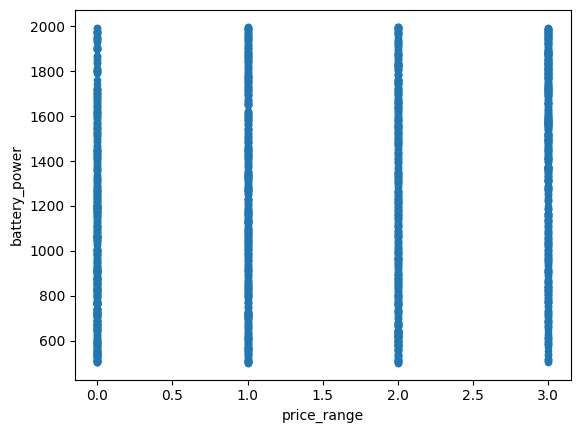

In [ ]:
# Battery Power Graph.
# Battery Power feature not effect on mobile range price
data.plot(x='price_range',y='battery_power',kind='scatter')
plt.show()

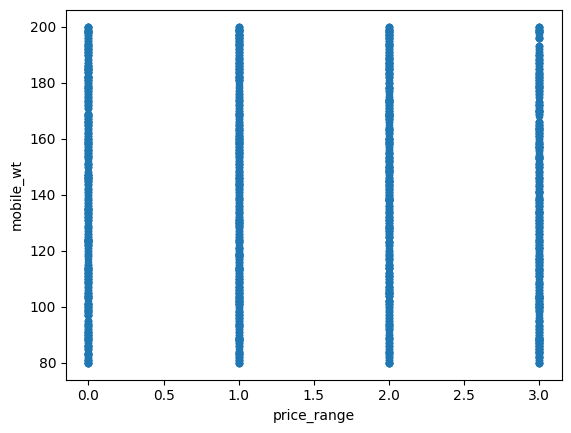

In [ ]:
# mobile weight
data.plot(x='price_range',y='mobile_wt',kind='scatter')
plt.show()

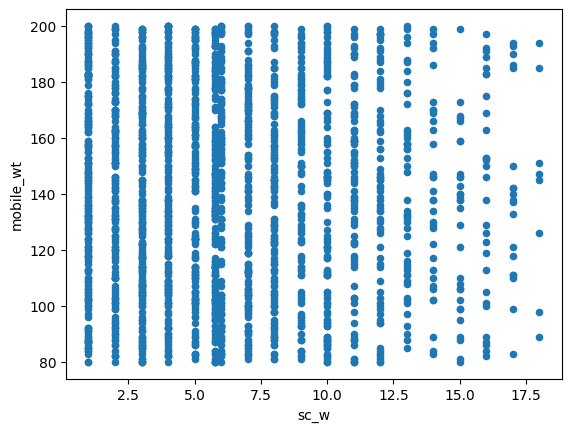

In [ ]:
# mobile weight
data.plot(x='sc_w',y='mobile_wt',kind='scatter')
plt.show()


## Chart 6. Statictics KDE Plot



---

In statistics, kernel density estimation (KDE) is the application of kernel smoothing for probability density estimation, i.e., a non-parametric method to estimate the probability density function of a random variable based on kernels as weights.

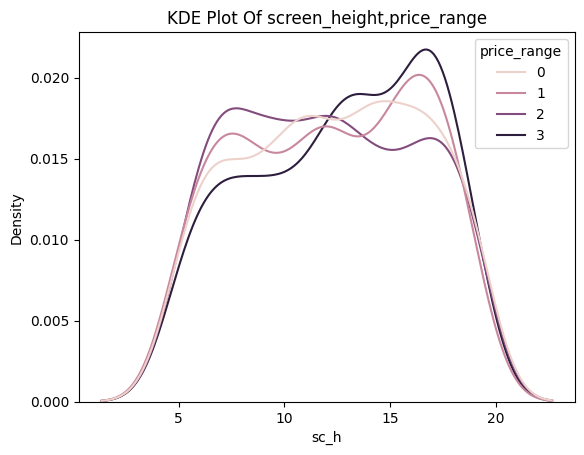

In [ ]:
# KDE Plot described as Kernel Density Estimate is used for visualizing the Probability Density of a continuous variable
sns.kdeplot(data=data, x='sc_h', hue='price_range')
plt.title('KDE Plot Of screen_height,price_range')
plt.show()

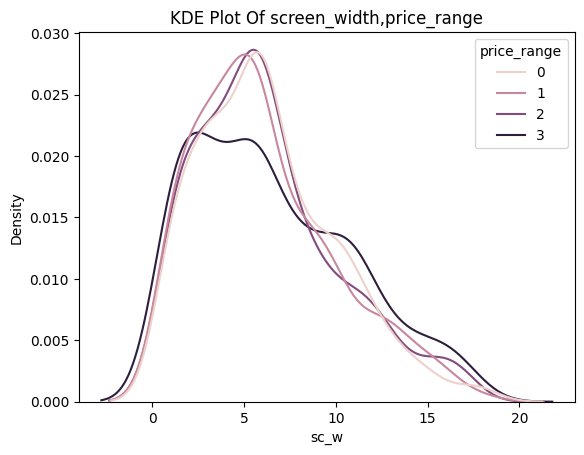

In [ ]:
# KDE Plot described as Kernel Density Estimate is used for visualizing the Probability Density of a continuous variable
sns.kdeplot(data=data, x='sc_w', hue='price_range')
plt.title('KDE Plot Of screen_width,price_range')
plt.show()

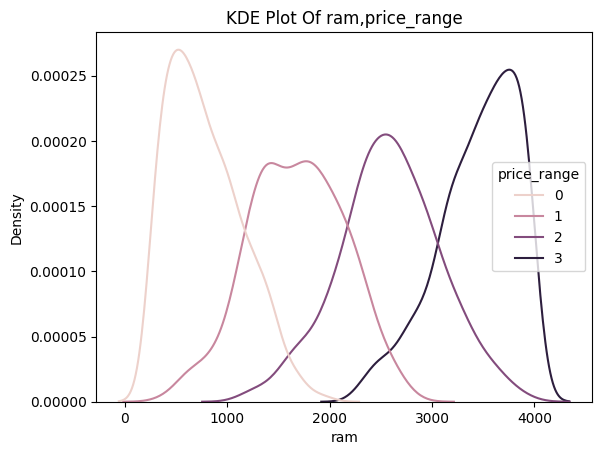

In [ ]:
# KDE Plot described as Kernel Density Estimate is used for visualizing the Probability Density of a continuous variable
sns.kdeplot(data=data, x='ram', hue='price_range')
plt.title('KDE Plot Of ram,price_range')
plt.show()

## Chart 6. Joint Plot.


---

The joint plot is a way of understanding the relationship between two variables and the distribution of individuals of each variable. The joint plot mainly consists of three separate plots in which, one of it was the middle figure that is used to see the relationship between x and y.

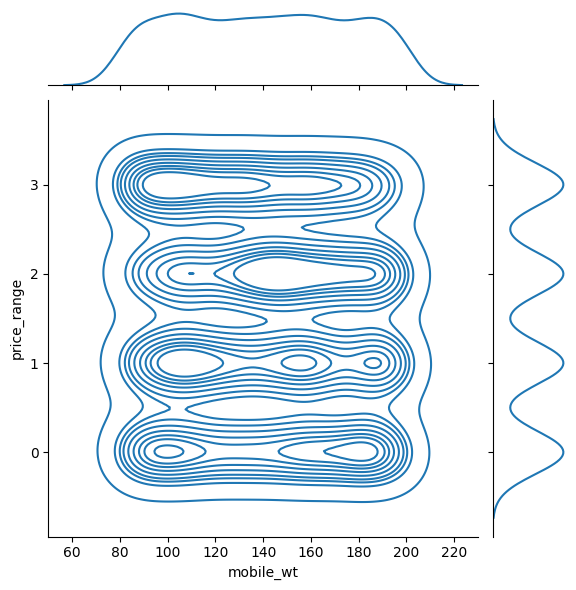

In [ ]:
# Joint Plot
sns.jointplot(x='mobile_wt',y='price_range',data=data,kind='kde')
plt.show()

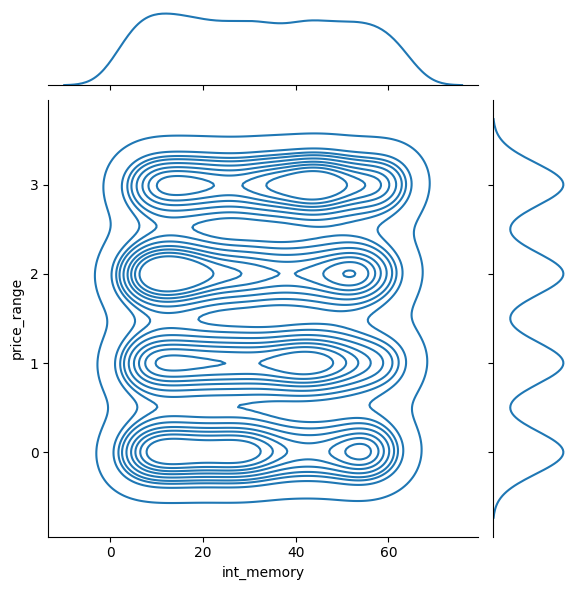

In [ ]:
sns.jointplot(x='int_memory',y='price_range',data=data,kind='kde')
plt.show()

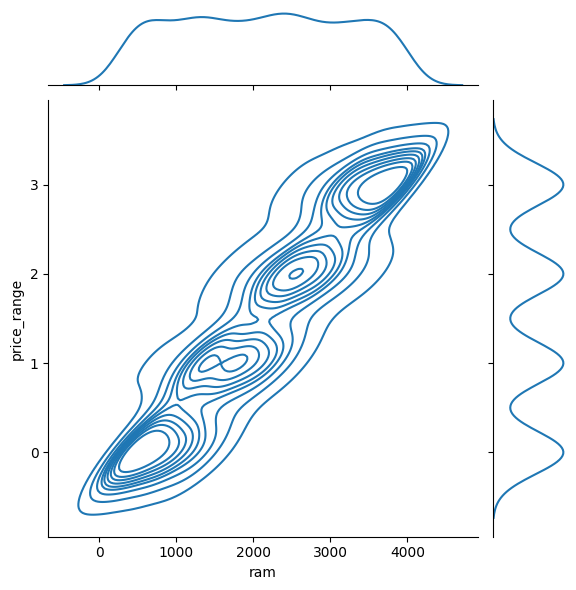

In [ ]:
sns.jointplot(x='ram',y='price_range',data=data,kind='kde')
plt.show()

## Pixel_Width

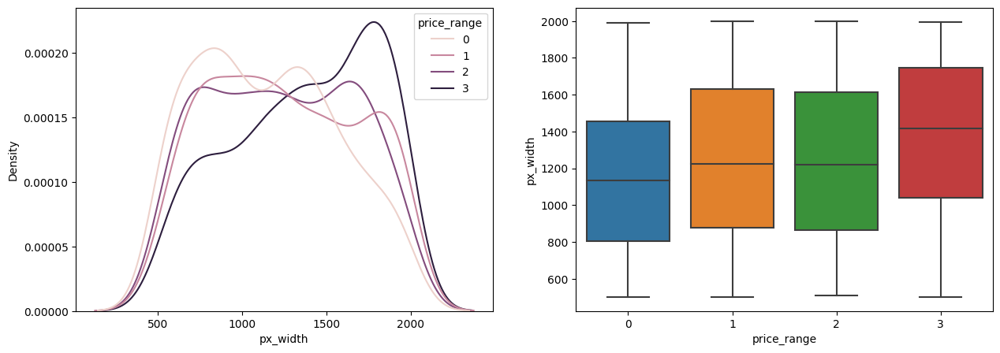

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=data, x='px_width', hue='price_range', ax=axs[0])
sns.boxplot(data=data, x='price_range', y='px_width', ax=axs[1])
plt.show()

There is not a continuous increase in pixel width as we move from Low cost to Very high cost. Mobiles with 'Medium cost' and 'High cost' has almost equal pixel width. so we can say that it would be a driving factor in deciding price_range.

## Pixel Height

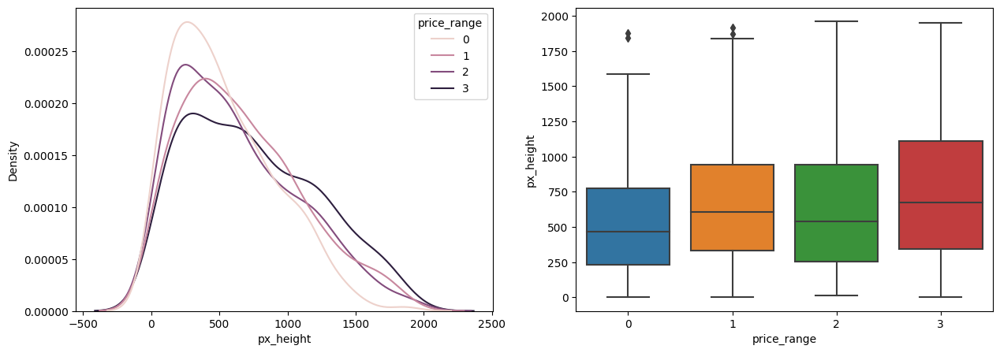

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=data, x='px_height', hue='price_range', ax=axs[0])
sns.boxplot(data=data, x='price_range', y='px_height', ax=axs[1])
plt.show()

Pixel height is almost similar as we move from Low cost to Very high cost.little variation in pixel_height

## Primary camera Megapixels

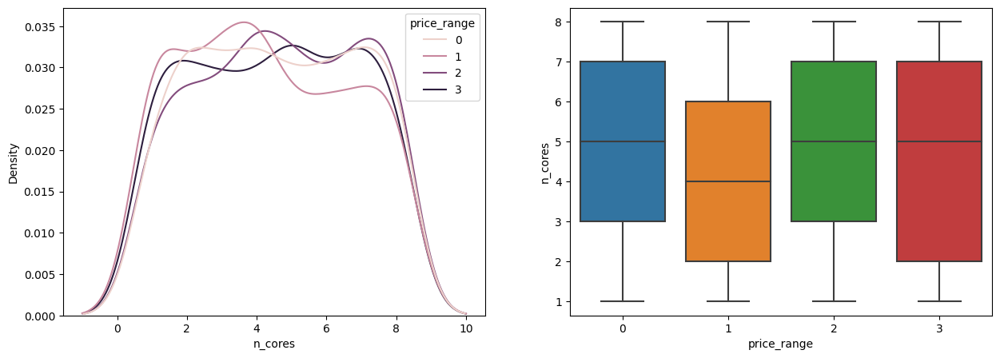

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=data, x='n_cores', hue='price_range', ax=axs[0])
sns.boxplot(data=data, x='price_range', y='n_cores', ax=axs[1])
plt.show()

## Mobile Weight

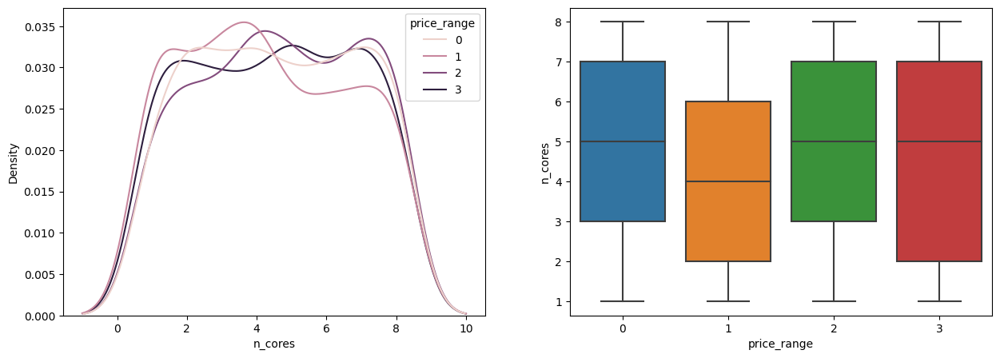

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=data, x='n_cores', hue='price_range', ax=axs[0])
sns.boxplot(data=data, x='price_range', y='n_cores', ax=axs[1])
plt.show()

costly phones are lighter

## Screen Size

In [ ]:
# Defining new variable sc_size

data['sc_size'] = np.sqrt((data['sc_h']**2) + (data['sc_w']**2))
data['sc_size'] = round(data['sc_size']/2.54, 2)

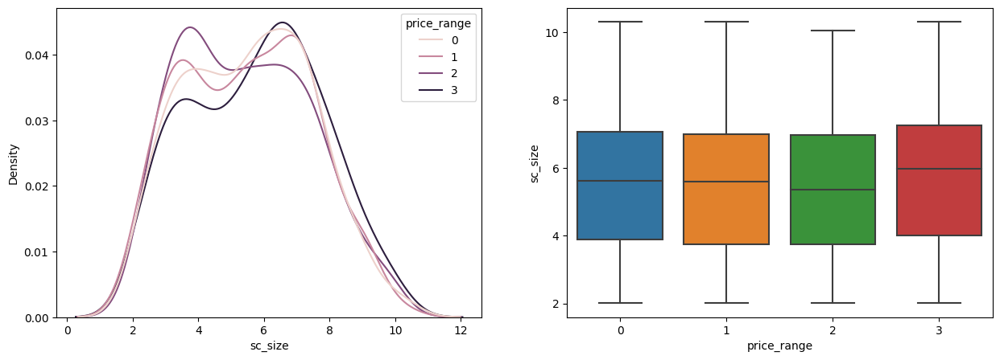

In [ ]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
sns.kdeplot(data=data, x='sc_size', hue='price_range', ax=axs[0])
sns.boxplot(data=data, x='price_range', y='sc_size', ax=axs[1])
plt.show()


Screen Size shows little variation along the target variables. This can be helpful in predicting the target categories.

In [ ]:
# Let's drop sc_h and s_w

data.drop(['sc_h', 'sc_w'], axis = 1, inplace = True)

In [ ]:
binary_features = [ 'four_g', 'three_g']


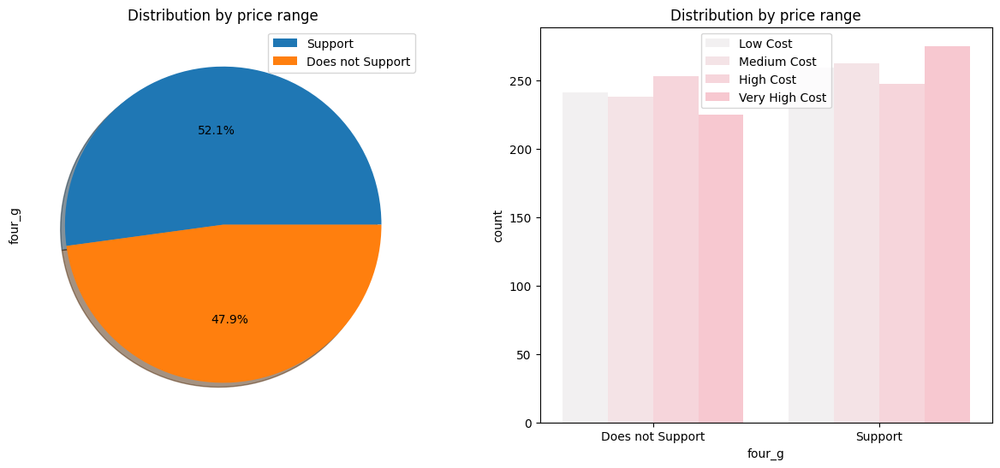

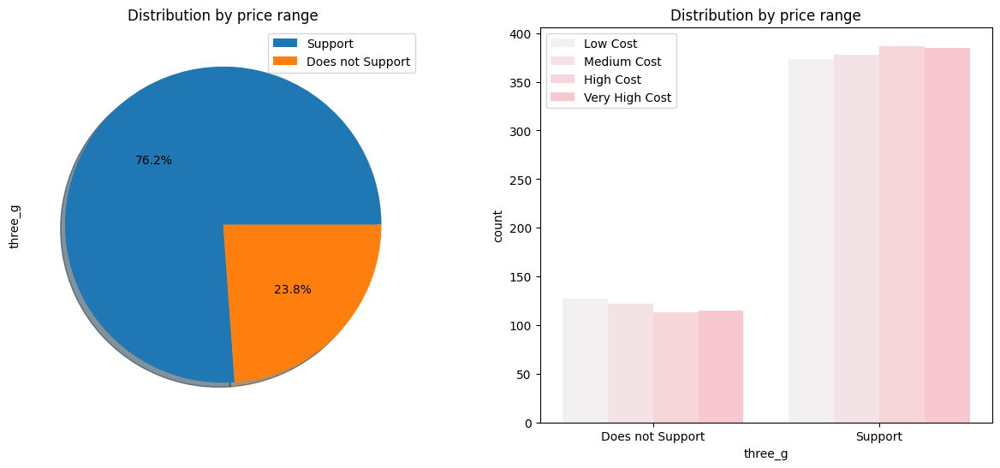

In [ ]:
# Plot of binary features against price range

for col in binary_features:
  fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 6))

  data[col].value_counts().plot.pie (autopct='%1.1f%%', ax = ax1, shadow=True, labeldistance=None)
  ax1.set_title('Distribution by price range')
  ax1.legend(['Support', 'Does not Support'])
  sns.countplot(x = col, hue = 'price_range', data = data, ax = ax2, color = 'pink')
  ax2.set_title('Distribution by price range')
  ax2.set_xlabel(col)
  ax2.legend(['Low Cost', 'Medium Cost', 'High Cost', 'Very High Cost'])
  ax2.set_xticklabels(['Does not Support', 'Support'])

feature 'three_g' play an important feature in prediction

## multi-collinearity.


---

Multicollinearity can be defined as the presence of high correlations between two or more independent variables (predictors). This is essentially a phenomenon in which independent variables are correlated with one another. It measures the degree to which two variables are related based on their correlation.




<Axes: >

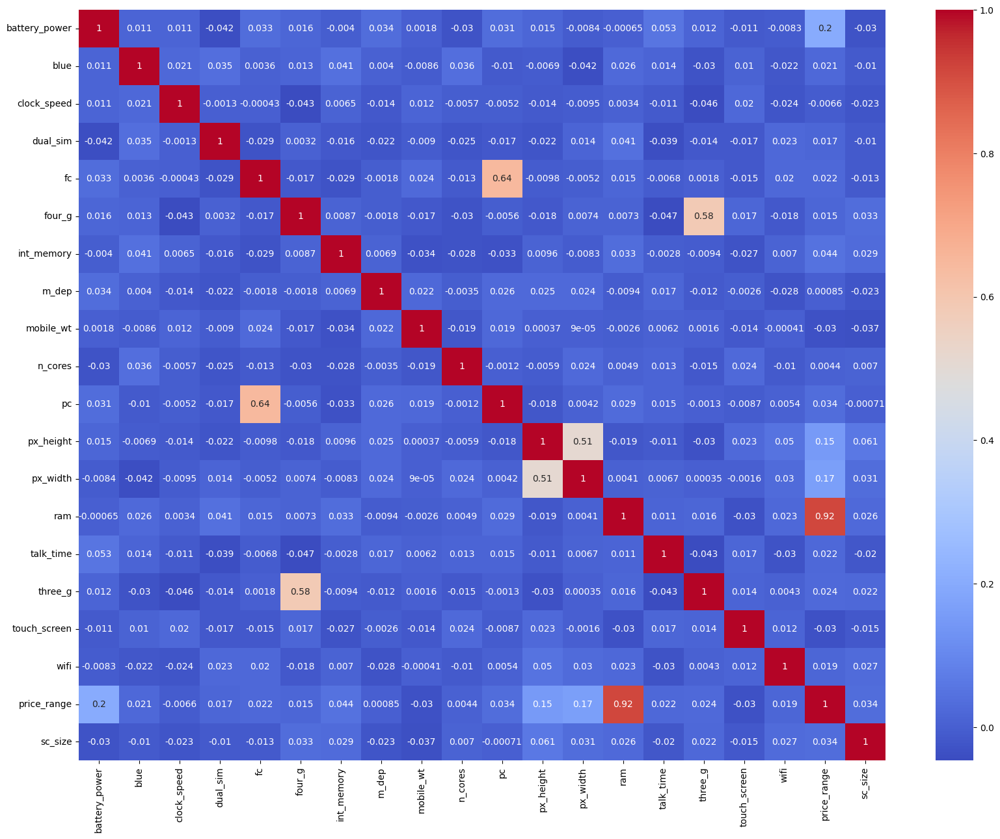

In [ ]:
# Checking for multi-collinearity

correlation = data.corr()
plt.figure(figsize = [20, 15])
sns.heatmap(correlation, cmap = 'coolwarm', annot = True)

RAM and price_range shows high correlation which is a good sign, it signifies that RAM will play major deciding factor in estimating the price range.

There is some collinearity in feature pairs ('pc', 'fc') and ('px_width', 'px_height'). Both correlations are justified since there are good chances that if front camera of a phone is good, the back camera would also be good.

Also, if px_height increases, pixel width also increases, that means the overall pixels in the screen. We can replace these two features with one feature. Front Camera megapixels and Primary camera megapixels are different entities despite of showing colinearity. So we'll be keeping them as they are.

<Axes: >

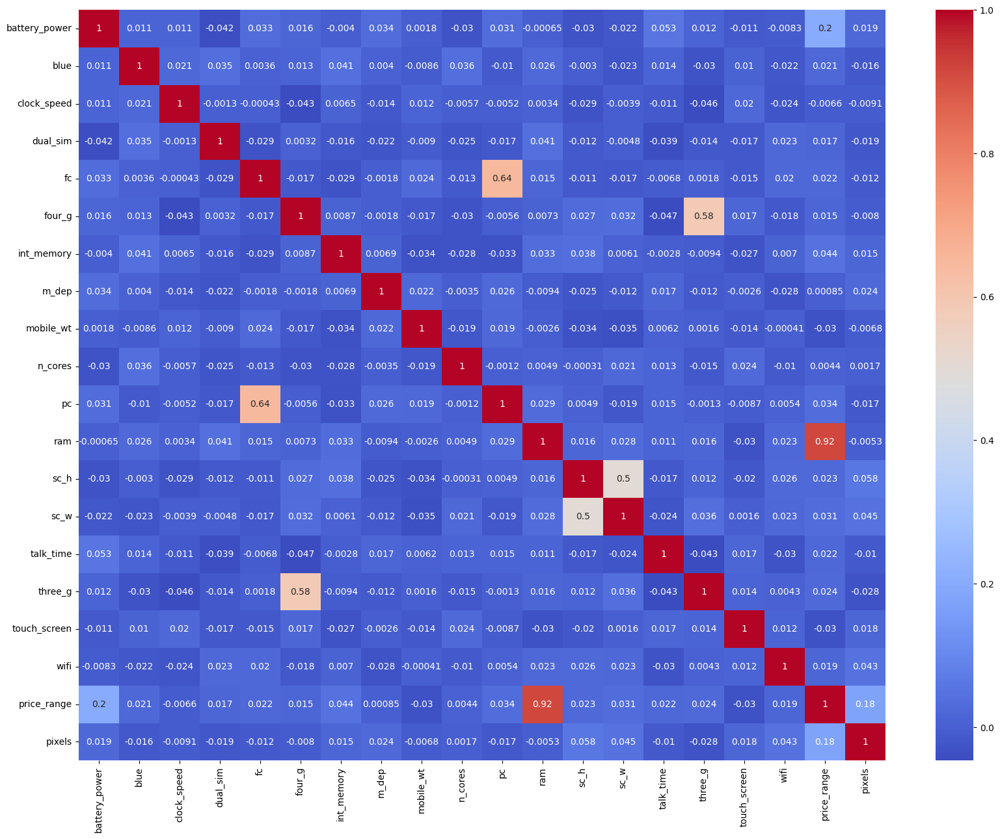

In [ ]:
#  defining new variable for pixels

data['pixels'] = data['px_height']*data['px_width']
# Dropping px_height and px_width

data.drop(['px_height', 'px_width'], axis = 1, inplace = True)
# Checking for multi-collinearity

correlation = data.corr()
plt.figure(figsize = [20, 15])
sns.heatmap(correlation, cmap = 'coolwarm', annot = True)

## Multivariate Analysis.


---

Multivariate analysis is based in observation and analysis of more than one statistical outcome variable at a time.

<Figure size 800x500 with 0 Axes>

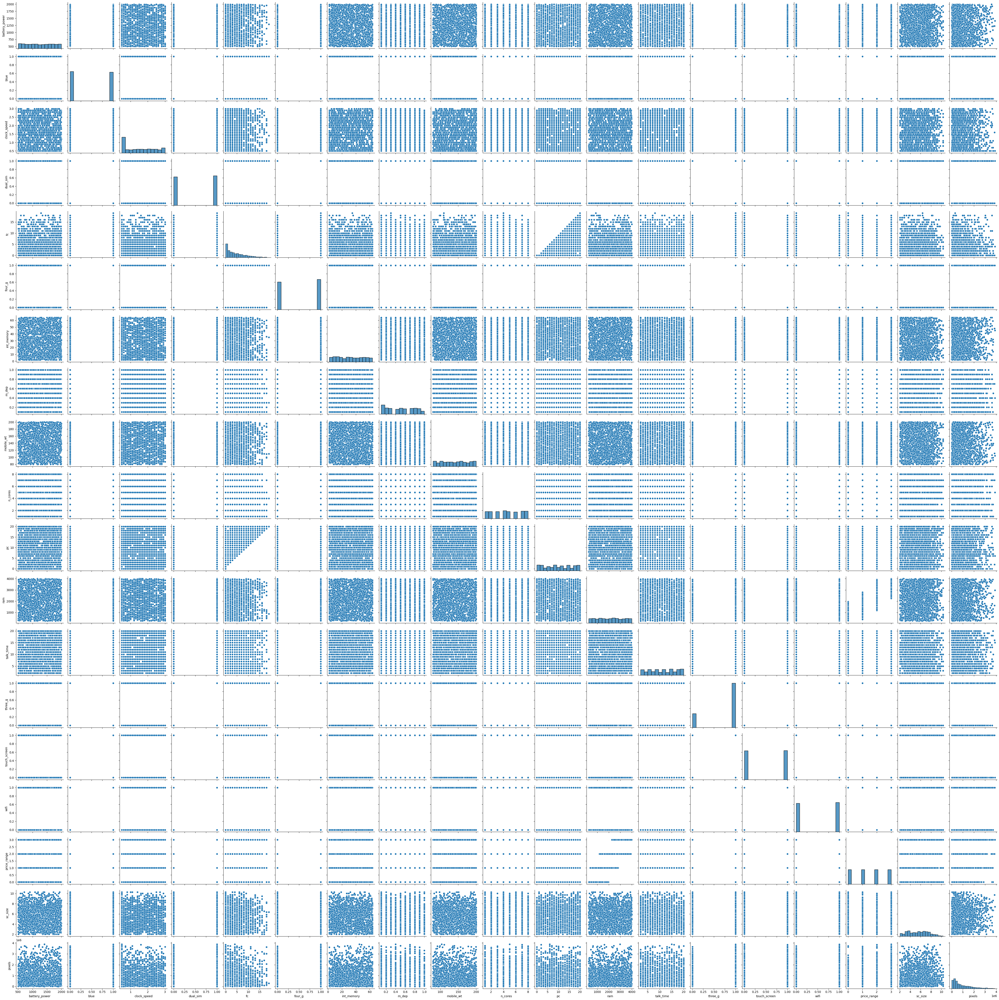

In [ ]:

# Pair plot of entire data
plt.figure(figsize=(8,5))
sns.pairplot(data)
plt.show()

# Define x,y

In [ ]:
x=data.drop('price_range',axis=1)
y=data['price_range']

# Feature Scalling (MinMax Scaller)

Use StandardScaler if you want each feature to have zero-mean, unit standard-deviation. If you want more normally distributed data, and are okay with transforming your data. Check out scikit-learn's QuantileTransformer(output_distribution='normal') . Use MinMaxScaler if you want to have a light touch.

In [ ]:
# scaling value x.
# first of  all, we will apply min max scaller and then we will apply standard scaler on features depends on improve accuracy.


# create object to further use.

ms=MinMaxScaler()
X=ms.fit_transform(x)
X

array([[0.22778891, 0.        , 0.68      , ..., 1.        , 0.29915561,
        0.00365318],
       [0.34736139, 1.        , 0.        , ..., 0.        , 0.57780458,
        0.46281548],
       [0.04141617, 1.        , 0.        , ..., 0.        , 0.28829916,
        0.55757275],
       ...,
       [0.94188377, 0.        , 0.16      , ..., 0.        , 0.18817853,
        0.36435304],
       [0.6753507 , 0.        , 0.16      , ..., 1.        , 0.7358263 ,
        0.05770195],
       [0.00601202, 1.        , 0.6       , ..., 1.        , 0.67913148,
        0.09349304]])

# Split Data

we will use train_test_split normal because my data is balance.

In [ ]:
# split data into training and testing data
trainx,testx,trainy,testy=train_test_split(X,y,random_state=1,test_size=0.20)

In [ ]:
# shape of the train and test data
print(trainx.shape)
print(testx.shape)
print(trainy.shape)
print(testy.shape)

(1600, 18)
(400, 18)
(1600,)
(400,)


# Logistic Regression


---


(test_acc=0.87,train_acc=0.92)

In [ ]:
# create object of Logistic Regression
lr=LogisticRegression()

# fit the data

model=lr.fit(trainx,trainy)

# Create Func to apply diffrent diffrent metrics using graph

In [ ]:
from matplotlib import legend
# Function for evaluation metric for regression
def EvaluationMetric(Xt,yt,yp,disp="on"):
  ''' Take the different set of parameter and prints evaluation metrics '''
  Classification_Report=(classification_report(y_true=yt,y_pred=yp))
  if disp=="on":
    print('Classification Report :',Classification_Report)


  #Plotting Actual and Predicted Values
  plt.figure(figsize=(18,6))
  plt.plot((yp)[:100]) 
  plt.plot((np.array(yt)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title('Actual and Predicted Time Duration')


  
  return (Classification_Report) 

Classification Report :               precision    recall  f1-score   support

           0       0.91      0.99      0.95        92
           1       0.83      0.82      0.83        96
           2       0.83      0.76      0.79       106
           3       0.91      0.92      0.91       106

    accuracy                           0.87       400
   macro avg       0.87      0.87      0.87       400
weighted avg       0.87      0.87      0.87       400



'              precision    recall  f1-score   support\n\n           0       0.91      0.99      0.95        92\n           1       0.83      0.82      0.83        96\n           2       0.83      0.76      0.79       106\n           3       0.91      0.92      0.91       106\n\n    accuracy                           0.87       400\n   macro avg       0.87      0.87      0.87       400\nweighted avg       0.87      0.87      0.87       400\n'

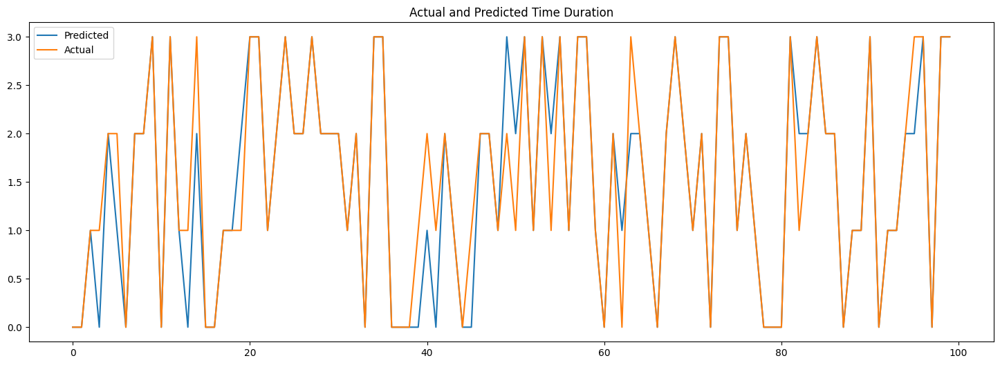

In [ ]:
#Evaluation metrics for Test set
EvaluationMetric(testx,testy,model.predict(testx))

Classification Report :               precision    recall  f1-score   support

           0       0.94      0.98      0.96       408
           1       0.90      0.87      0.89       404
           2       0.89      0.86      0.87       394
           3       0.94      0.95      0.94       394

    accuracy                           0.92      1600
   macro avg       0.91      0.92      0.91      1600
weighted avg       0.92      0.92      0.92      1600



'              precision    recall  f1-score   support\n\n           0       0.94      0.98      0.96       408\n           1       0.90      0.87      0.89       404\n           2       0.89      0.86      0.87       394\n           3       0.94      0.95      0.94       394\n\n    accuracy                           0.92      1600\n   macro avg       0.91      0.92      0.91      1600\nweighted avg       0.92      0.92      0.92      1600\n'

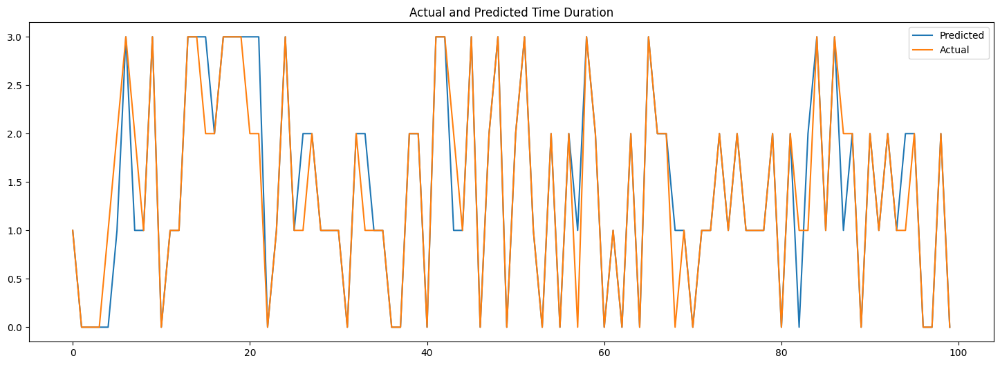

In [ ]:
#Evaluation metrics for Train set
EvaluationMetric(trainx,trainy,model.predict(trainx))

[[91  1  0  0]
 [ 9 79  8  0]
 [ 0 15 81 10]
 [ 0  0  9 97]]


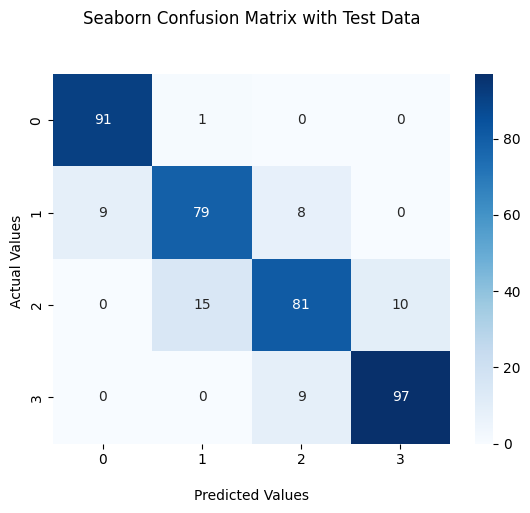

In [ ]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(testy, model.predict(testx))

print(cf_matrix)

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with Test Data\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

[[398  10   0   0]
 [ 27 353  24   0]
 [  0  28 340  26]
 [  0   0  20 374]]


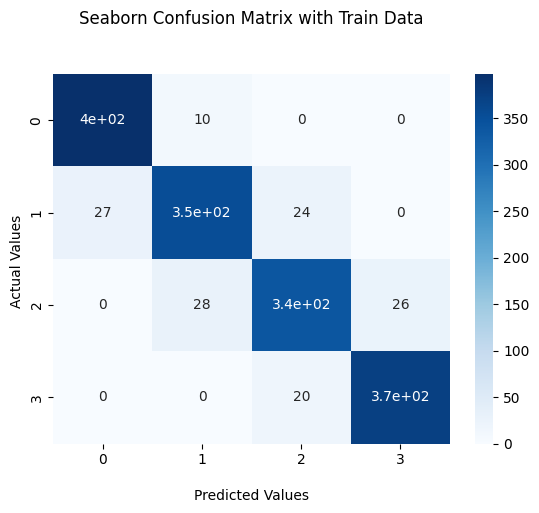

In [ ]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(trainy, model.predict(trainx))

print(cf_matrix)

ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with Train Data\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels([0,1,2,3])
ax.yaxis.set_ticklabels([0,1,2,3])

## Display the visualization of the Confusion Matrix.
plt.show()

In [ ]:
# classification report of test data

print(classification_report(testy,model.predict(testx)))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95        92
           1       0.83      0.82      0.83        96
           2       0.83      0.76      0.79       106
           3       0.91      0.92      0.91       106

    accuracy                           0.87       400
   macro avg       0.87      0.87      0.87       400
weighted avg       0.87      0.87      0.87       400



# Decision Tree Classifier


---


(test_acc=0.84,train_acc=0.1)


In [ ]:
from sklearn.tree import DecisionTreeClassifier

# create object
dtr=DecisionTreeClassifier()

# fit the data

model=dtr.fit(trainx,trainy)

predy=model.predict(testx)


# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

# accuracy score of test data

print('train_accuracy :',accuracy_score(trainy,model.predict(trainx)))

accuracy : 0.845
calssification report :               precision    recall  f1-score   support

           0       0.94      0.91      0.93        92
           1       0.77      0.85      0.81        96
           2       0.77      0.77      0.77       106
           3       0.92      0.85      0.88       106

    accuracy                           0.84       400
   macro avg       0.85      0.85      0.85       400
weighted avg       0.85      0.84      0.85       400

train_accuracy : 1.0


# Random Forest 


---



(test_acc=0.87,train_acc=0.1)

In [ ]:

from sklearn.ensemble import RandomForestClassifier

# create object
rfc=RandomForestClassifier()

# fit the data

model=rfc.fit(trainx,trainy)

predy=model.predict(testx)

In [ ]:
# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

# accuracy score of train data

print('train accuracy :',accuracy_score(trainy,model.predict(trainx)))

accuracy : 0.86
calssification report :               precision    recall  f1-score   support

           0       0.91      0.96      0.93        92
           1       0.78      0.83      0.81        96
           2       0.81      0.77      0.79       106
           3       0.94      0.89      0.91       106

    accuracy                           0.86       400
   macro avg       0.86      0.86      0.86       400
weighted avg       0.86      0.86      0.86       400

train accuracy : 1.0


## Hyper Paramter Tunning Using Grid Search CV 


---


(test_acc=0.88,train_acc=0.99)

In [ ]:
# define parmaters
prameters={'n_estimators':[50,100,150],
           'max_depth':[2,4,6,8,10],
           'min_samples_split':[2,4,5],
           'min_samples_leaf':[1,2,3],
           'criterion':['gini','entropy']
           }

In [ ]:
# import  grid search cv
from sklearn.model_selection import GridSearchCV

# create object
gsv=GridSearchCV(estimator=rfc,param_grid=prameters,scoring='accuracy',n_jobs=-1,cv=5)

# fit the model

gsv.fit(trainx,trainy)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 4, 5],
                         'n_estimators': [50, 100, 150]},
             scoring='accuracy')

In [ ]:
print('Best Estimator:',gsv.best_estimator_)
print('Best Score:',gsv.best_score_)

Best Estimator: RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=5, n_estimators=150)
Best Score: 0.8881249999999999


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# create object
rfc=RandomForestClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=4, n_estimators=150)

# fit the data

model=rfc.fit(trainx,trainy)

test_predy=model.predict(testx)
train_predy=model.predict(trainx)

# fit the model

print('test_acc:',accuracy_score(testy,test_predy))
print('train_acc:',accuracy_score(trainy,train_predy))

test_acc: 0.8625
train_acc: 0.99875


# KNN 


---


(acc=0.41)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn=KNeighborsClassifier()

# fit the data

model=knn.fit(trainx,trainy)

predy=model.predict(testx)


# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

accuracy : 0.4075
calssification report :               precision    recall  f1-score   support

           0       0.51      0.62      0.56        92
           1       0.30      0.35      0.32        96
           2       0.35      0.38      0.36       106
           3       0.53      0.30      0.39       106

    accuracy                           0.41       400
   macro avg       0.42      0.41      0.41       400
weighted avg       0.42      0.41      0.40       400



# Naive Bayes 


---


(test=0.76,train=0.81)

In [ ]:
from sklearn.naive_bayes import GaussianNB

gnb=GaussianNB()

# fit the data

model=gnb.fit(trainx,trainy)

predy=model.predict(testx)


# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

# accuracy score of test data

print('train accuracy :',accuracy_score(trainy,model.predict(trainx)))



accuracy : 0.755
calssification report :               precision    recall  f1-score   support

           0       0.89      0.87      0.88        92
           1       0.66      0.70      0.68        96
           2       0.64      0.67      0.65       106
           3       0.86      0.79      0.82       106

    accuracy                           0.76       400
   macro avg       0.76      0.76      0.76       400
weighted avg       0.76      0.76      0.76       400

train accuracy : 0.816875


# XG Boost 


---


(test=0.90,train=1.0)

In [ ]:
from xgboost import XGBClassifier

xgb=XGBClassifier()

# fit the data

model=xgb.fit(trainx,trainy)

predy=model.predict(testx)


# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

# accuracy score of train data

print('accuracy :',accuracy_score(trainy,model.predict(trainx)))

accuracy : 0.8975
calssification report :               precision    recall  f1-score   support

           0       0.98      0.92      0.95        92
           1       0.82      0.93      0.87        96
           2       0.85      0.85      0.85       106
           3       0.97      0.90      0.93       106

    accuracy                           0.90       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.90      0.90      0.90       400

accuracy : 1.0


## Hyper Parameter Tunning 


---


(train=0.98,test=0.9)

In [ ]:
xgb = XGBClassifier(max_depth = 5, learning_rate = 0.1)
xgb.fit(trainx, trainy)
XGBClassifier(max_depth=5, objective='multi:softprob')
# Prediction

y_pred_train = xgb.predict(trainx)
y_pred_test = xgb.predict(testx)
# Evaluation metrics for test

score = classification_report(testy, y_pred_test)
print('Classification Report for XGBoost(Test set)= ')
print(score)

Classification Report for XGBoost(Test set)= 
              precision    recall  f1-score   support

           0       0.98      0.92      0.95        92
           1       0.83      0.93      0.88        96
           2       0.84      0.85      0.85       106
           3       0.95      0.89      0.92       106

    accuracy                           0.90       400
   macro avg       0.90      0.90      0.90       400
weighted avg       0.90      0.90      0.90       400



In [ ]:
# Evaluation metrics for train

score = classification_report(trainy, y_pred_train)
print('Classification Report for XGBoost(Train set)= ')
print(score)

Classification Report for XGBoost(Train set)= 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       408
           1       1.00      1.00      1.00       404
           2       1.00      1.00      1.00       394
           3       1.00      1.00      1.00       394

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600



In [ ]:
# Cross validation

grid = GridSearchCV(xgb, param_grid={'n_estimators': (10, 200), 
                                     'learning_rate': [1, 0.5, 0.1, 0.01, 0.001], 
                                     'max_depth': (5, 10),
                                     'gamma': [1.5, 1.8], 'subsample': [0.3, 0.5, 0.8]}, 
                    cv = 5, scoring = 'accuracy', verbose = 10)
grid.fit(trainx,trainy)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 1/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.912 total time=   0.1s
[CV 2/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 2/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.872 total time=   0.1s
[CV 3/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 3/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.872 total time=   0.1s
[CV 4/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 4/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.884 total time=   0.1s
[CV 5/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, m...
                                     max_delta_step=None, max_depth=5,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softprob', predictor=None, ...),
             param_grid={'gamma': [1.5, 1.8],
                         'learning_rate': [1, 0.5, 0.1, 0.01, 0.001],
                         'max_depth': (5, 10), 'n_estimators': (10, 200),
                         'subsample': [0.3, 0.5, 0.8]},
             scoring='accuracy', verbose=10)

In [ ]:
# Best Estimator

print(grid.best_estimator_)

# Best Score

print(grid.best_score_)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1.5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
0.9100000000000001


In [ ]:
xgb=XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=1.5, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None)

# fit the data

model=xgb.fit(trainx,trainy)

predy=model.predict(testx)


# accuracy,classification report

from sklearn.metrics import accuracy_score

# accuracy score of test data

print('accuracy :',accuracy_score(testy,predy))

# classificatio report 

print('calssification report :',classification_report(testy,predy))

# accuracy score of train data

print('train_accuracy :',accuracy_score(trainy,model.predict(trainx)))

accuracy : 0.89
calssification report :               precision    recall  f1-score   support

           0       0.97      0.95      0.96        92
           1       0.82      0.90      0.86        96
           2       0.84      0.81      0.83       106
           3       0.94      0.92      0.93       106

    accuracy                           0.89       400
   macro avg       0.89      0.89      0.89       400
weighted avg       0.89      0.89      0.89       400

train_accuracy : 0.98125


In [ ]:
# accuracy of training data

print('accuracy :',accuracy_score(trainy,model.predict(trainx)))

# classificatio report 

print('calssification report :',classification_report(trainy,model.predict(trainx)))

accuracy : 0.98125
calssification report :               precision    recall  f1-score   support

           0       0.99      0.99      0.99       408
           1       0.97      0.98      0.97       404
           2       0.98      0.97      0.97       394
           3       1.00      0.99      0.99       394

    accuracy                           0.98      1600
   macro avg       0.98      0.98      0.98      1600
weighted avg       0.98      0.98      0.98      1600



# Adaboost Classifier 


---


(train=066,test=0.67)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

adb =AdaBoostClassifier()

adb.fit(trainx,trainy)

print(accuracy_score(testy,adb.predict(testx)))

print(accuracy_score(trainy,adb.predict(trainx)))

0.6775
0.666875


## Hyper Paramter Tunning 


---


(test=0.81,train=0.80)

In [ ]:
# Hyper Paramter Tunning
from sklearn.model_selection import GridSearchCV
grid_params = {'n_estimators': [100,200,300,400,500,600,700]}
grid_object = GridSearchCV(estimator = adb, param_grid = grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
grid_object.fit(trainx,trainy)

GridSearchCV(cv=3, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'n_estimators': [100, 200, 300, 400, 500, 600, 700]},
             scoring='accuracy')

In [ ]:
# Best Estimator
# Best score
print(grid_object.best_estimator_)
print(grid_object.best_score_)

AdaBoostClassifier(n_estimators=700)
0.726255641985979


In [ ]:
# fit the model
# compare model accuracy of train data and test data
from sklearn.ensemble import AdaBoostClassifier

adb =AdaBoostClassifier(n_estimators=700)

adb.fit(trainx,trainy)

print('Test Accuracy:',accuracy_score(testy,adb.predict(testx)))

print('Train Accuracy:',accuracy_score(trainy,adb.predict(trainx)))

Test Accuracy: 0.8
Train Accuracy: 0.798125


In [ ]:
# Again Hyper Paramte Tunning for increse accuracy.
# Change Hyperparamter
grid_params = {'n_estimators': [100,200,300,400,500,600,700],'learning_rate':[0.1,0.3,0.5,1,1.5],'algorithm':['SAMME', 'SAMME.R']}
grid_object = GridSearchCV(estimator = adb, param_grid = grid_params, scoring = 'accuracy', cv = 5, n_jobs = -1)
grid_object.fit(trainx,trainy)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(n_estimators=500), n_jobs=-1,
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.3, 0.5, 1, 1.5],
                         'n_estimators': [100, 200, 300, 400, 500, 600, 700]},
             scoring='accuracy')

In [ ]:
# Best Estimator
# Best score
print(grid_object.best_estimator_)
print(grid_object.best_score_)

AdaBoostClassifier(n_estimators=800)
0.7931250000000001


In [ ]:
from sklearn.ensemble import AdaBoostClassifier

adb =AdaBoostClassifier(n_estimators=700,learning_rate=1)

adb.fit(trainx,trainy)

print('Test Accuracy:',accuracy_score(testy,adb.predict(testx)))

print('Train Accuracy:',accuracy_score(trainy,adb.predict(trainx)))

Test Accuracy: 0.8
Train Accuracy: 0.798125


In [ ]:
# Again Hyper Paramter Tunning.
# Increase the n_estimators.
from sklearn.model_selection import GridSearchCV
grid_params = {'n_estimators': [500,600,700,800,1000,1200]}
grid_object = GridSearchCV(estimator = adb, param_grid = grid_params, scoring = 'accuracy', cv = 5, n_jobs = -1)
grid_object.fit(trainx,trainy)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(n_estimators=500), n_jobs=-1,
             param_grid={'n_estimators': [500, 600, 700, 800, 1000, 1200]},
             scoring='accuracy')

In [ ]:
# Best Estimator.
# Best score.
print(grid_object.best_estimator_)
print(grid_object.best_score_)

AdaBoostClassifier(n_estimators=800)
0.7931250000000001


In [ ]:
from sklearn.ensemble import AdaBoostClassifier

adb =AdaBoostClassifier(n_estimators=800)

adb.fit(trainx,trainy)

print('Test Accuracy:',accuracy_score(testy,adb.predict(testx)))

print('Train Accuracy:',accuracy_score(trainy,adb.predict(trainx)))

Test Accuracy: 0.805
Train Accuracy: 0.803125


# Feature Scalling (Standard Scaller)

Adaboost Classifier



---

train_acc=0.74,test_acc=0.71

In [ ]:
# Feature scalling Using Standard Scaller.
# Standard Scaller.
# Apply Adaboost Classifier.
ss=StandardScaler()
ss_x=ss.fit_transform(x)
ss_x

# Train Test Split
xtr,xte,ytr,yte=train_test_split(ss_x,y,random_state=2,test_size=0.20)

# Adaboost Classifier
from sklearn.ensemble import AdaBoostClassifier

adaboost =AdaBoostClassifier(n_estimators=800)

# fit model
adaboost.fit(xtr,ytr)

print('Test Accuracy:',accuracy_score(yte,adaboost.predict(xte)))

print('Train Accuracy:',accuracy_score(ytr,adaboost.predict(xtr)))

Test Accuracy: 0.7175
Train Accuracy: 0.741875


XG Boost


---


train_acc=1.0,test_acc=0.90

In [ ]:
# Feature scalling Using Standard Scaller.
# Standard Scaller.
# Apply Adaboost Classifier.
ss=StandardScaler()
ss_x=ss.fit_transform(x)
ss_x

# Train Test Split
xtr,xte,ytr,yte=train_test_split(ss_x,y,random_state=2,test_size=0.20)

# xgboost Classifier
xgboost = XGBClassifier(max_depth = 5, learning_rate = 0.1,objective='multi:softprob')
# fit the model
xgboost.fit(xtr, ytr)
# Prediction

y_pred_tr = xgboost.predict(xtr)
y_pred_te = xgboost.predict(xte)
# Evaluation metrics for test

print('test accuracy:',accuracy_score(yte,y_pred_te))

print('train accuracy:',accuracy_score(ytr,y_pred_tr))

test accuracy: 0.905
train accuracy: 1.0


# Apply ml models on data with out feature scalling

In [ ]:
# split data in to training and testing data
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=1,test_size=0.20)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [ ]:
# apply random forest classifier
def ml_func(algo,x_train,x_test,y_train,y_test):
  # create object
  object=algo()
  # fit model
  model=object.fit(x_train,y_train)
  # prediction data
  predy_test=model.predict(x_test)
  predy_train=model.predict(x_train)
  # calculate acc of training and testing data
  print('test_acc:',accuracy_score(y_test,predy_test))
  print('train_acc:',accuracy_score(y_train,predy_train))

ml_func(RandomForestClassifier,x_train,x_test,y_train,y_test)

test_acc: 0.8475
train_acc: 1.0


In [ ]:
# Adaboost Classifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

adb=AdaBoostClassifier()
 
grid_params = {'n_estimators': [100,200,300,400,500,600,700]}
grid_object = GridSearchCV(estimator = adb, param_grid = grid_params, scoring = 'accuracy', cv = 3, n_jobs = -1)
grid_object.fit(x_train,y_train)

GridSearchCV(cv=3, estimator=AdaBoostClassifier(), n_jobs=-1,
             param_grid={'n_estimators': [100, 200, 300, 400, 500, 600, 700]},
             scoring='accuracy')

In [ ]:
# create object.
adb =AdaBoostClassifier(n_estimators=800,learning_rate=1)
# fit model on training data.
adb.fit(x_train,y_train)
# calculate test accuracy.
print('Test Accuracy:',accuracy_score(y_test,adb.predict(x_test)))
# calculate train accuracy.
print('Train Accuracy:',accuracy_score(y_train,adb.predict(x_train)))

Test Accuracy: 0.765
Train Accuracy: 0.769375


# Conclusion

* In this article, we looked at classification. Classifiers represent the intersection of advanced machine theory and practical application. These algorithms are more than just a sorting mechanism for organising unlabeled data instances into distinct groupings. Classifiers include a unique set of dynamic rules that include an interpretation mechanism for dealing with ambiguous or unknown values, all of which are suited to the kind of inputs being analysed. Most classifiers also utilise probability estimates, which enable end-users to adjust data categorization using utility functions.   

* Adaboost Classifier model is working well on this data and return train acc 80% and test acc 81% .

* KNN model is not working well on this data return acc 41% .                                                            

* Hyper Paramter Tunning Using Grid Search CV is best performace on data.you can see above ml models return accuracy after tune hyperparamter then accurcy automaticaly icreased.

# <font size='6px'><font color='#FF3206'><font color='yellow'>Thanks Almabetter for this opportunity.